In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

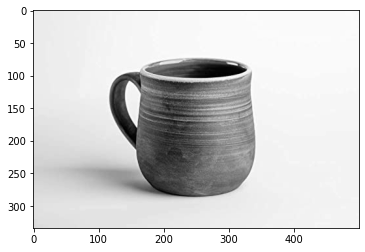

In [2]:
img = cv2.imread('../images/cup.jpg',cv2.IMREAD_GRAYSCALE)
plt.imshow(img,cmap='gray')

# 1 Canny edge detector

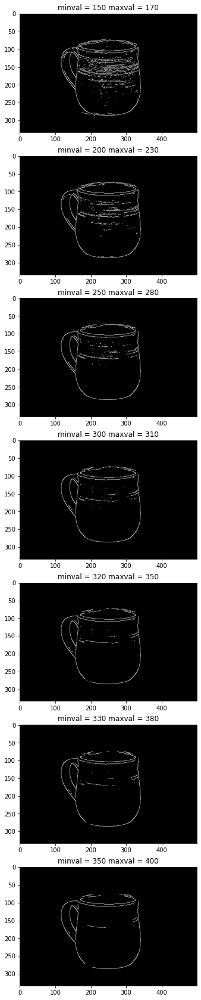

In [3]:
values= [(150,170),(200,230),(250,280),(300,310),(320,350),(330,380),(350,400)]
plt.figure(figsize=(80,30))
i = 1
for v in values:
    output_img = cv2.Canny(img, v[0],v[1])
    plt.subplot(len(values),1,i)
    i = i+1
    plt.imshow(output_img,cmap='gray')
    plt.title('minval = '+str(v[0])+' maxval = '+str(v[1]))



# 2 Best value for cup.jpg when minval=300 and maxval=310

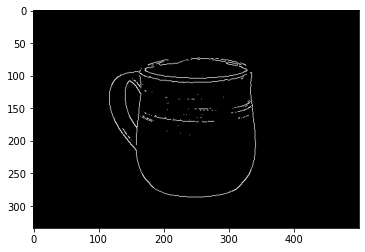

In [4]:
output_img = cv2.Canny(img,300,310)
plt.imshow(output_img,cmap='gray')

# CONVOLUTION

In [5]:
def convolution(image,kernel):
    img=image.copy()
    img=img.astype(np.float64)
    kernel= kernel.astype(np.float64)
    output_img = np.zeros(img.shape)
    for i in range(int(kernel.shape[0]/2),image.shape[0]-int((kernel.shape[0]-1)/2)):
        for j in range(int(kernel.shape[1]/2),image.shape[1]-int((kernel.shape[1]-1)/2)):
            output_img[i][j]=sum(sum(kernel* img[i-int(kernel.shape[0]/2) : i+1+int((kernel.shape[0]-1)/2),j-int(kernel.shape[1]/2):j+1+int((kernel.shape[1]-1)/2)]))
            #checking bounds
            output_img[i][j] = min(255,output_img[i][j])
            output_img[i][j] = max(0,output_img[i][j])
    output_img = output_img.astype(np.uint8)
    return output_img

# Roberts

In [6]:
def roberts(image):
    img=image.copy()
    plt.figure(figsize=(15,15))
    plt.subplot(2,2,1)
    plt.imshow(img,cmap='gray')
    plt.title('original image')
    kernel = np.array([[0, 1], [-1, 0]]) 
    output_img1 = convolution(img,kernel)
    plt.subplot(2,2,2)
    plt.imshow(output_img1,cmap='gray')
    plt.title('robertx')
    kernel = np.array([[1, 0], [0, -1]]) 
    output_img2 = convolution(img,kernel)
    plt.subplot(2,2,3)
    plt.imshow(output_img2,cmap='gray')
    plt.title('roberty')
    output_img1 = output_img1.astype(np.float64)
    output_img2 = output_img2.astype(np.float64)
    output_img = np.sqrt(output_img1*output_img1+output_img2*output_img2)
    output_img=output_img.astype(np.uint8)
    plt.subplot(2,2,4)
    plt.imshow(output_img,cmap='gray')
    plt.title('robert')

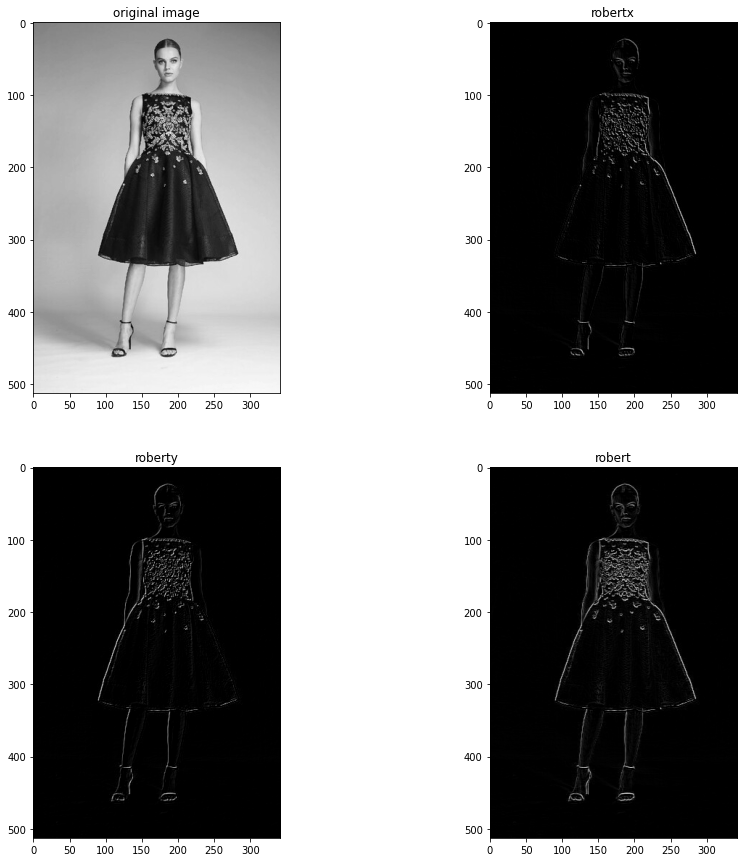

In [7]:
img = cv2.imread('../images/girl.jpg',cv2.IMREAD_GRAYSCALE)
roberts(img)

# Prewitt

In [8]:
def prewitt(image):
    img=image.copy()
    plt.figure(figsize=(15,15))
    plt.subplot(2,2,1)
    plt.imshow(img,cmap='gray')
    plt.title('original image')
    kernel = np.array([[-1, 0, 1],[-1, 0, 1],[-1, 0, 1]]) 
    output_img1 = convolution(img,kernel)
    plt.subplot(2,2,2)
    plt.imshow(output_img1,cmap='gray')
    plt.title('prewittx')
    kernel = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]]) 
    output_img2 = convolution(img,kernel)
    plt.subplot(2,2,3)
    plt.imshow(output_img2,cmap='gray')
    plt.title('prewitty')
    output_img1 = output_img1.astype(np.float64)
    output_img2 = output_img2.astype(np.float64)
    output_img = np.sqrt(output_img1*output_img1+output_img2*output_img2)
    output_img=output_img.astype(np.uint8)
    plt.subplot(2,2,4)
    plt.imshow(output_img,cmap='gray')
    plt.title('prewitt')

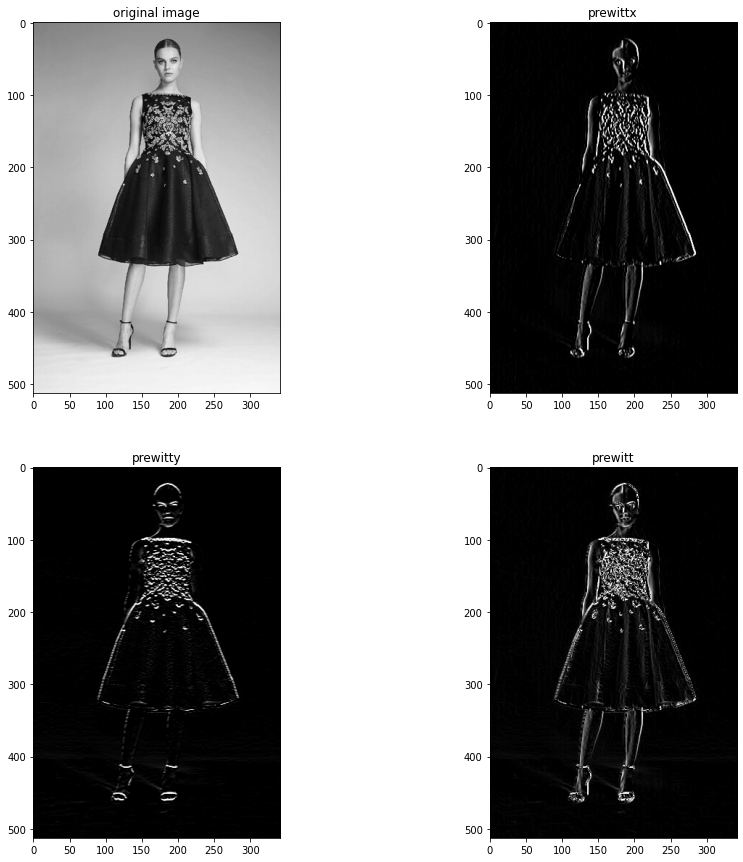

In [9]:
img = cv2.imread('../images/girl.jpg',cv2.IMREAD_GRAYSCALE)
prewitt(img)

# Sobel

In [10]:
def sobel(image):
    img=image.copy()
    plt.figure(figsize=(15,15))
    plt.subplot(2,2,1)
    plt.imshow(img,cmap='gray')
    plt.title('original image')
    kernel = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]) 
    output_img1 = convolution(img,kernel)
    plt.subplot(2,2,2)
    plt.imshow(output_img1,cmap='gray')
    plt.title('sobelx')
    kernel = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]])
    output_img2 = convolution(img,kernel)
    plt.subplot(2,2,3)
    plt.imshow(output_img2,cmap='gray')
    plt.title('sobely')
    output_img1 = output_img1.astype(np.float64)
    output_img2 = output_img2.astype(np.float64)
    output_img = np.sqrt(output_img1*output_img1+output_img2*output_img2)
    output_img=output_img.astype(np.uint8)
    plt.subplot(2,2,4)
    plt.imshow(output_img,cmap='gray')
    plt.title('sobel')

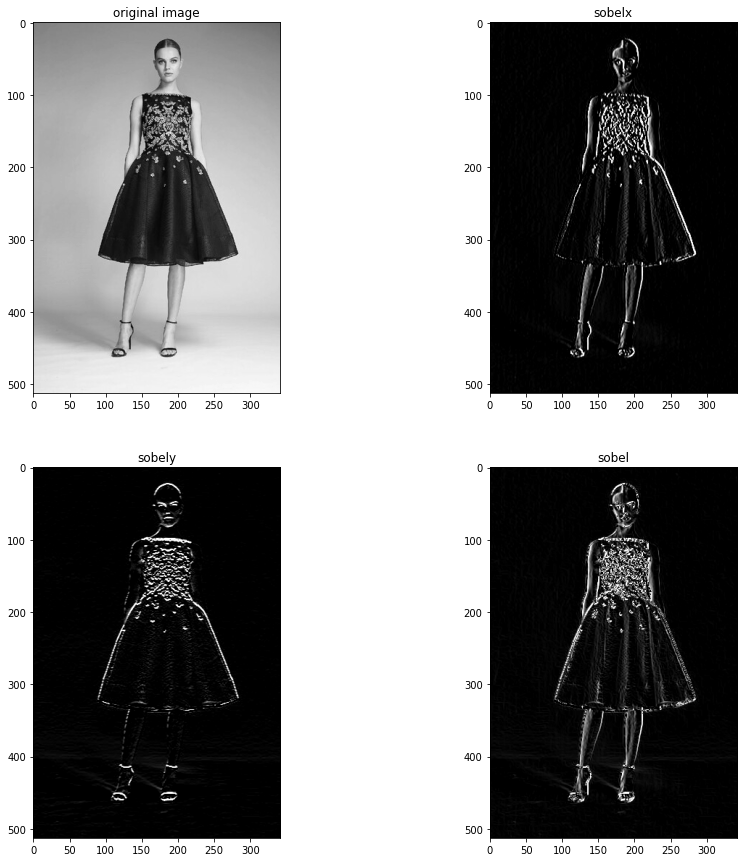

In [11]:
img = cv2.imread('../images/girl.jpg',cv2.IMREAD_GRAYSCALE)
sobel(img)

# Laplacian using kernel[1, 1, 1], [1, -8, 1], [1, 1, 1] kernel

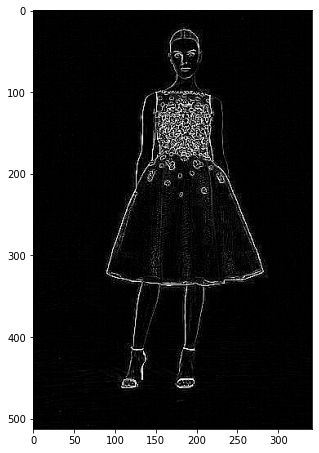

In [12]:
img = cv2.imread('../images/girl.jpg',cv2.IMREAD_GRAYSCALE)
kernel = np.array([[1, 1, 1], [1, -8, 1], [1, 1, 1]])
plt.figure(figsize=(5,10))
img_op = convolution(img,kernel)
plt.imshow(img_op,cmap='gray')


# Laplacian using [0, 1, 0],[1, -4, 1],[0, 1, 0] kernel

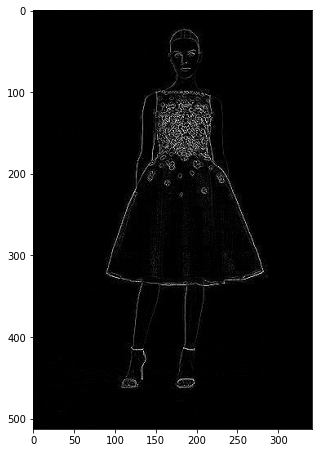

In [13]:
img = cv2.imread('../images/girl.jpg',cv2.IMREAD_GRAYSCALE)
kernel = np.array([[0, 1, 0],[1, -4, 1],[0, 1, 0]]) 
plt.figure(figsize=(5,10))
img_op = convolution(img,kernel)
plt.imshow(img_op,cmap='gray')

# Canny

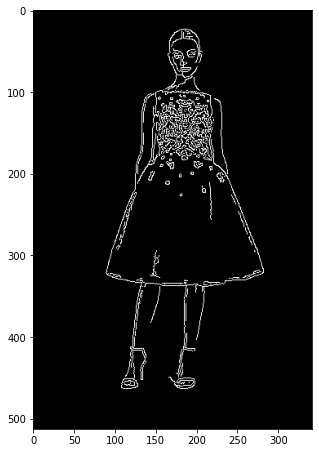

In [14]:
img = cv2.imread('../images/girl.jpg',cv2.IMREAD_GRAYSCALE)
output_img = cv2.Canny(img, 200,100)
plt.figure(figsize=(5,10))
plt.imshow(output_img,cmap='gray')

# Prewitt 5*5

In [15]:
def prewitt5(image):
    img=image.copy()
    plt.figure(figsize=(15,15))
    plt.subplot(2,2,1)
    plt.imshow(img,cmap='gray')
    plt.title('original image')
    kernel = np.array([[-2, -1,  0,  1,  2],[-2, -1,  0,  1,  2],[-2, -1,  0,  1,  2],[-2, -1,  0,  1,  2],[-2, -1,  0,  1,  2]])
    output_img1 = convolution(img,kernel)
    plt.subplot(2,2,2)
    plt.imshow(output_img1,cmap='gray')
    plt.title('prewittx')
    kernel = np.array([[ 2,  2,  2,  2,  2],[1,  1,  1,  1,  1],[ 0,  0,  0,  0,  0],[-1, -1, -1, -1, -1],[-2, -2, -2, -2, -2] 
])
    output_img2 = convolution(img,kernel)
    plt.subplot(2,2,3)
    plt.imshow(output_img2,cmap='gray')
    plt.title('prewitty')
    output_img1 = output_img1.astype(np.float64)
    output_img2 = output_img2.astype(np.float64)
    output_img = np.sqrt(output_img1*output_img1+output_img2*output_img2)
    output_img=output_img.astype(np.uint8)
    plt.subplot(2,2,4)
    plt.imshow(output_img,cmap='gray')
    plt.title('prewitt')

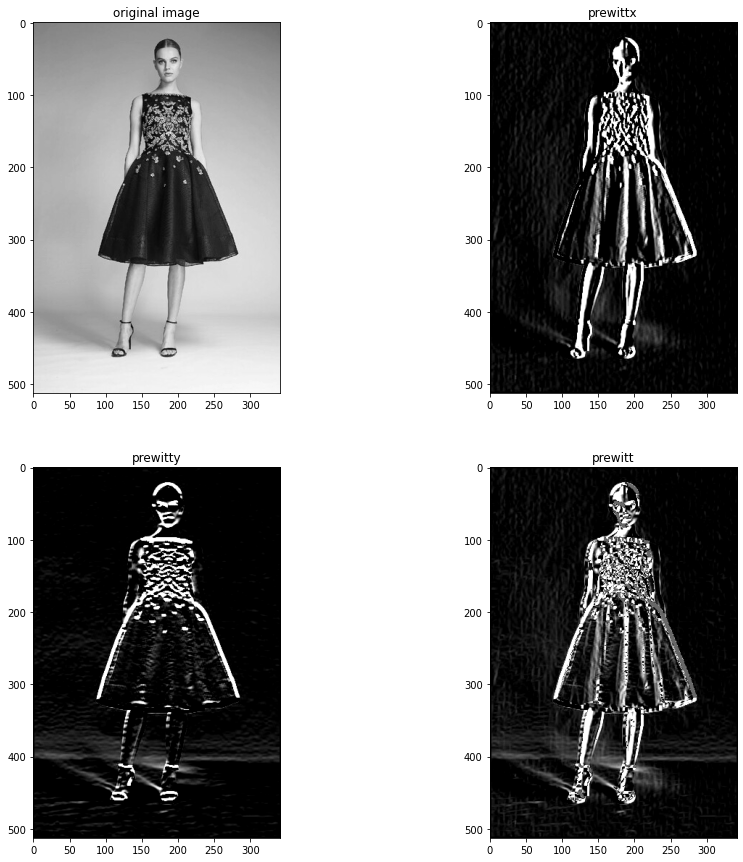

In [16]:
img = cv2.imread('../images/girl.jpg',cv2.IMREAD_GRAYSCALE)
prewitt5(img)

# Sobel 5*5

In [17]:
def sobel5(image):
    img=image.copy()
    plt.figure(figsize=(15,15))
    plt.subplot(2,2,1)
    plt.imshow(img,cmap='gray')
    plt.title('original image')
    kernel = np.array([[-5, -4,  0,  4,  5],[-8, -10,  0,  10,  8],[-10, -20,  0,  20,  10],[-8, -10,  0,  10,  8],[-5, -4,  0,  4,  5]])
    output_img1 = convolution(img,kernel)
    plt.subplot(2,2,2)
    plt.imshow(output_img1,cmap='gray')
    plt.title('sobelx')
    kernel = np.array([[  5,   8,  10,   8,   5],[  4,  10,  20,  10,   4],[  0,   0,   0,   0,   0],[ -4, -10, -20, -10,  -4],[ -5,  -8, -10,  -8,  -5]])
    output_img2 = convolution(img,kernel)
    plt.subplot(2,2,3)
    plt.imshow(output_img2,cmap='gray')
    plt.title('sobely')
    output_img1 = output_img1.astype(np.float64)
    output_img2 = output_img2.astype(np.float64)
    output_img = np.sqrt(output_img1*output_img1+output_img2*output_img2)
    output_img=output_img.astype(np.uint8)
    plt.subplot(2,2,4)
    plt.imshow(output_img,cmap='gray')
    plt.title('sobel')

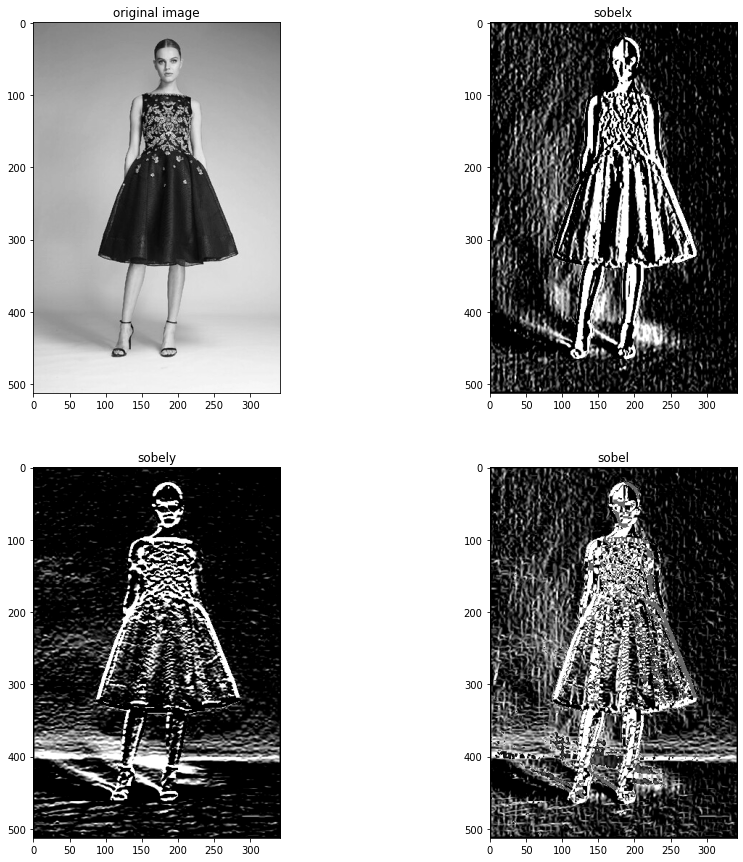

In [18]:
img = cv2.imread('../images/girl.jpg',cv2.IMREAD_GRAYSCALE)
sobel5(img)

# EXPLANATION

# GIRLNOISY1 

# roberts

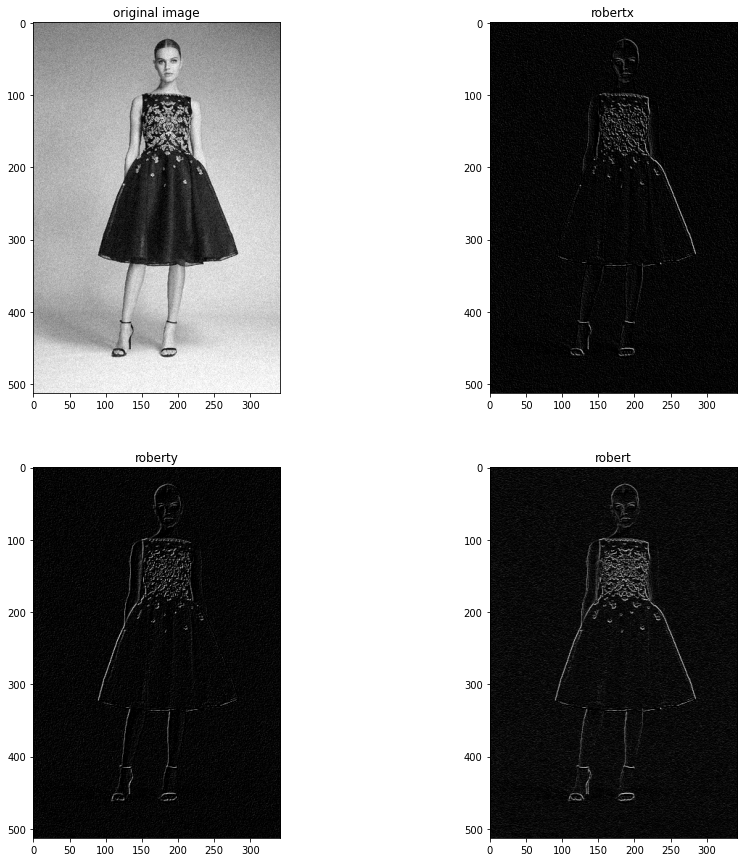

In [19]:
img = cv2.imread('../images/girlNoisy1.jpg',cv2.IMREAD_GRAYSCALE)
roberts(img)

# prewitt

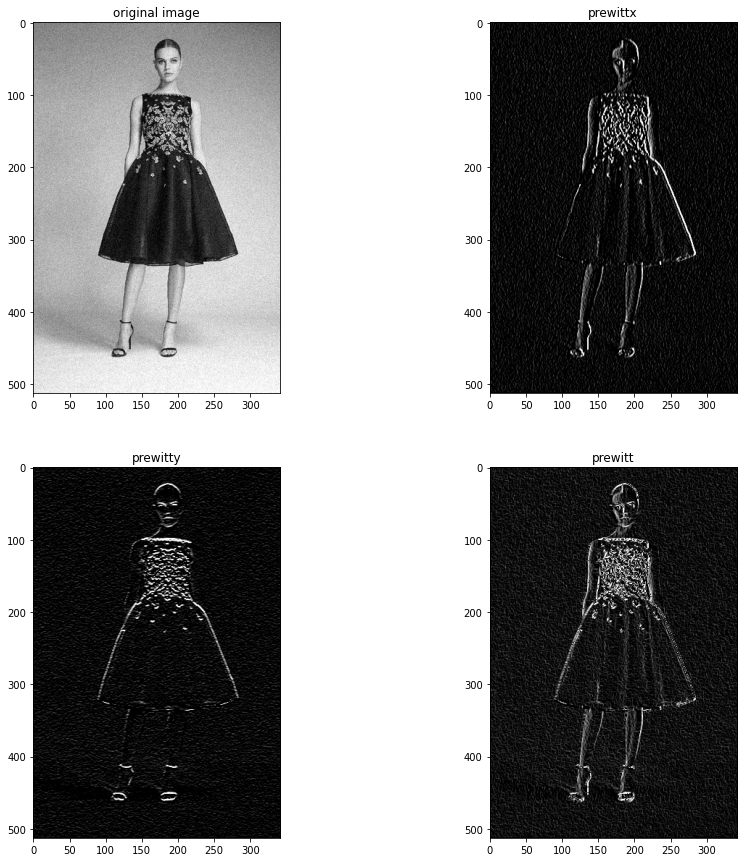

In [20]:
img = cv2.imread('../images/girlNoisy1.jpg',cv2.IMREAD_GRAYSCALE)
prewitt(img)

# Prewitt 5*5

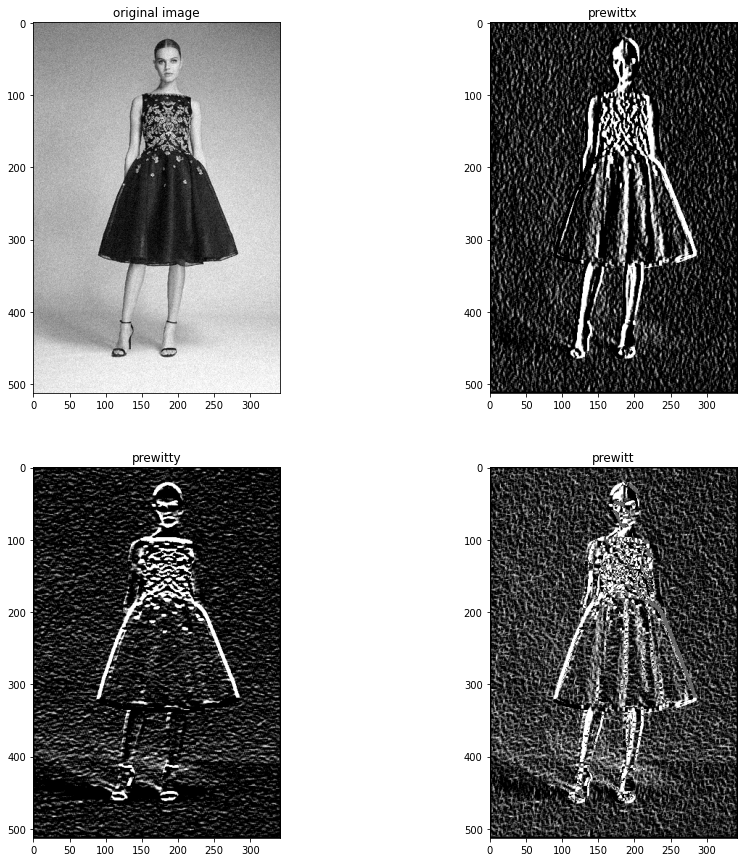

In [21]:
img = cv2.imread('../images/girlNoisy1.jpg',cv2.IMREAD_GRAYSCALE)
prewitt5(img)

# Sobel


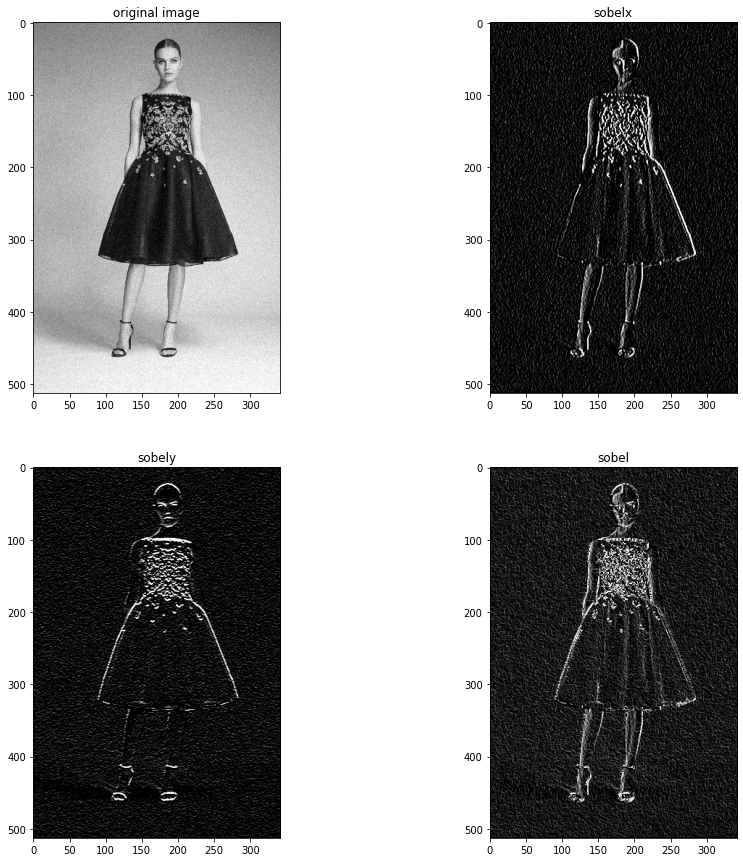

In [22]:
img = cv2.imread('../images/girlNoisy1.jpg',cv2.IMREAD_GRAYSCALE)
sobel(img)

# Sobel 5*5

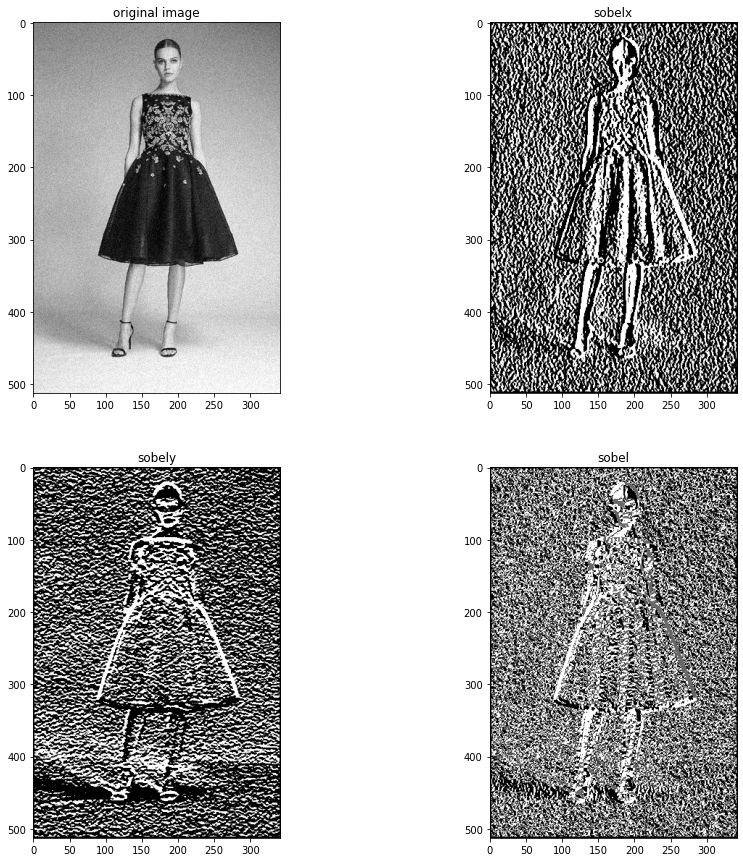

In [23]:
img = cv2.imread('../images/girlNoisy1.jpg',cv2.IMREAD_GRAYSCALE)
sobel5(img)

# Laplacian

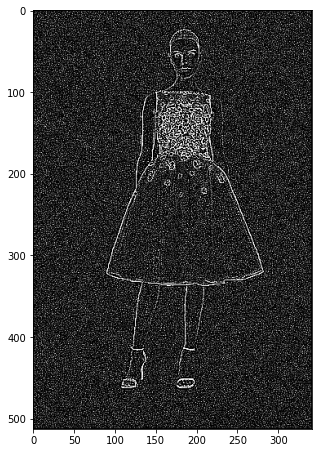

In [24]:
img = cv2.imread('../images/girlNoisy1.jpg',cv2.IMREAD_GRAYSCALE)
kernel = np.array([[1, 1, 1], [1, -8, 1], [1, 1, 1]])
plt.figure(figsize=(5,10))
img_op = convolution(img,kernel)
plt.imshow(img_op,cmap='gray')


# Canny

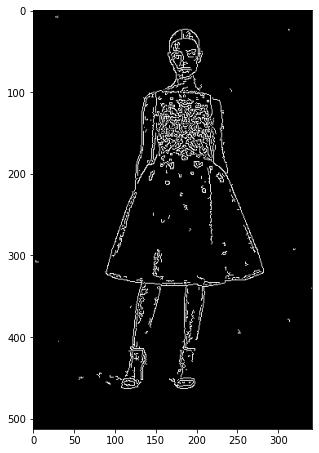

In [25]:
img = cv2.imread('../images/girlNoisy1.jpg',cv2.IMREAD_GRAYSCALE)
output_img = cv2.Canny(img, 200,100)
plt.figure(figsize=(5,10))
plt.imshow(output_img,cmap='gray')

# GirlNoisy2

# Roberts

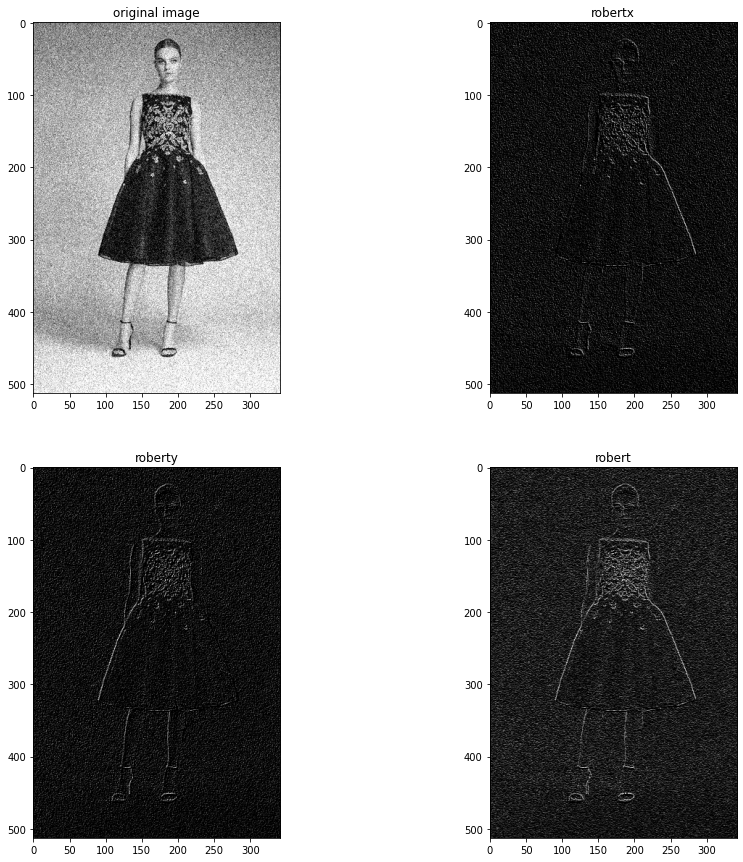

In [26]:
img = cv2.imread('../images/girlNoisy2.jpg',cv2.IMREAD_GRAYSCALE)
roberts(img)

# Prewitt

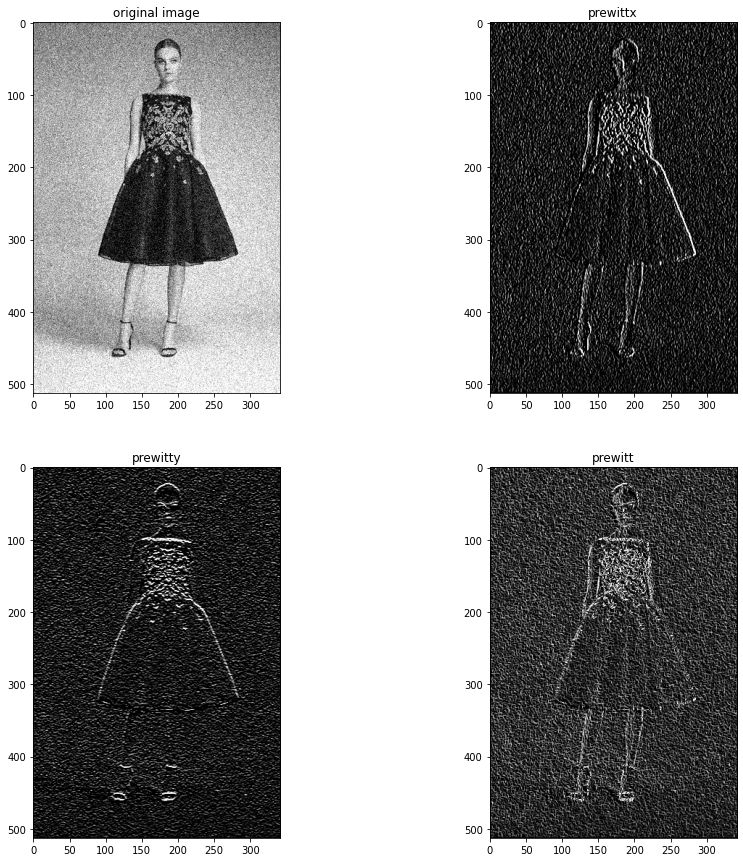

In [27]:
img = cv2.imread('../images/girlNoisy2.jpg',cv2.IMREAD_GRAYSCALE)
prewitt(img)

# Prewitt 5*5

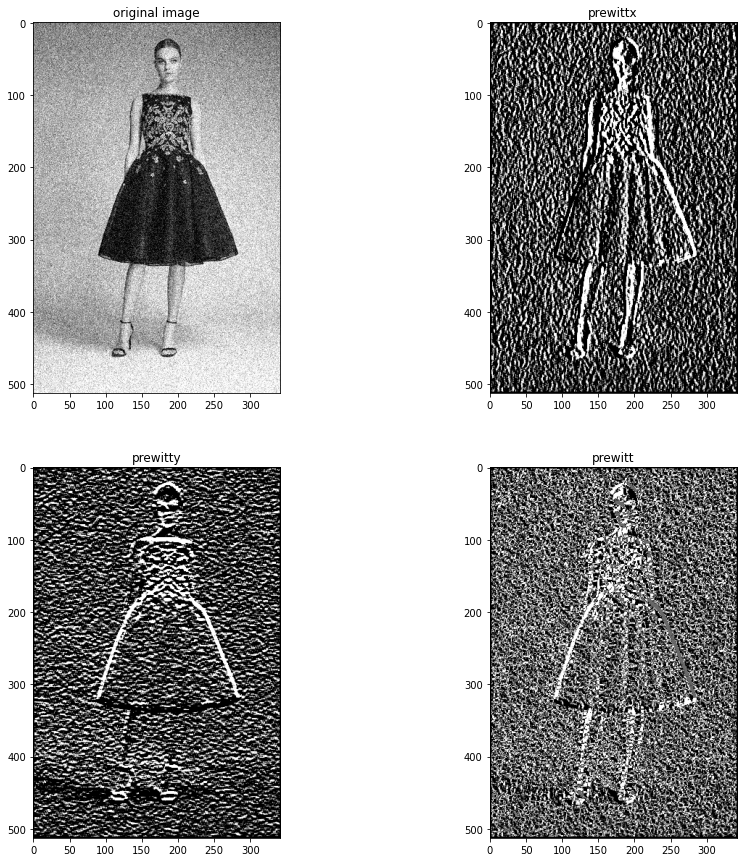

In [28]:
img = cv2.imread('../images/girlNoisy2.jpg',cv2.IMREAD_GRAYSCALE)
prewitt5(img)

# Sobel

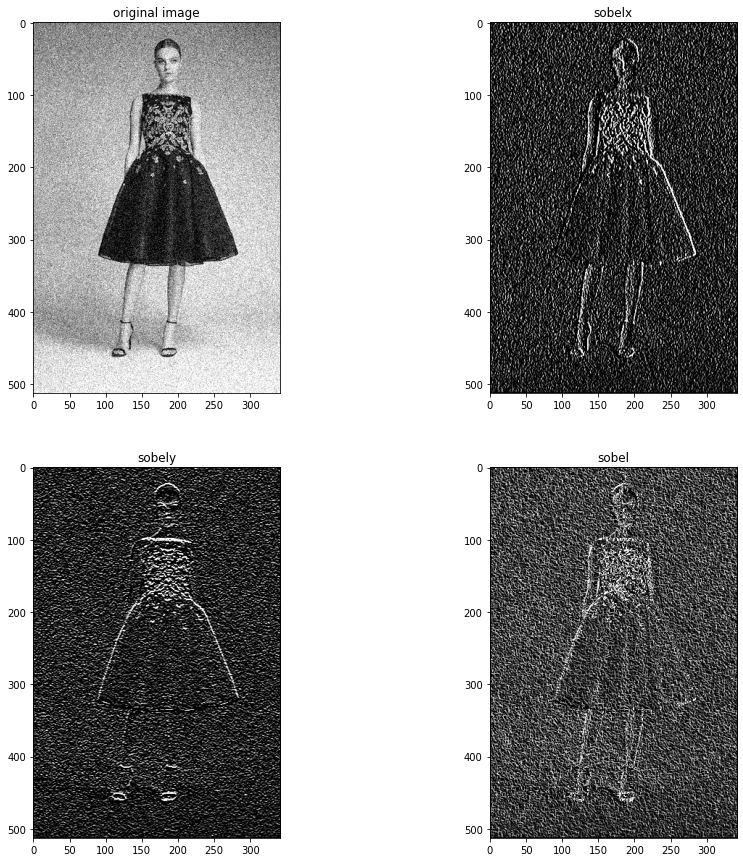

In [29]:
img = cv2.imread('../images/girlNoisy2.jpg',cv2.IMREAD_GRAYSCALE)
sobel(img)

# Sobel 5*5

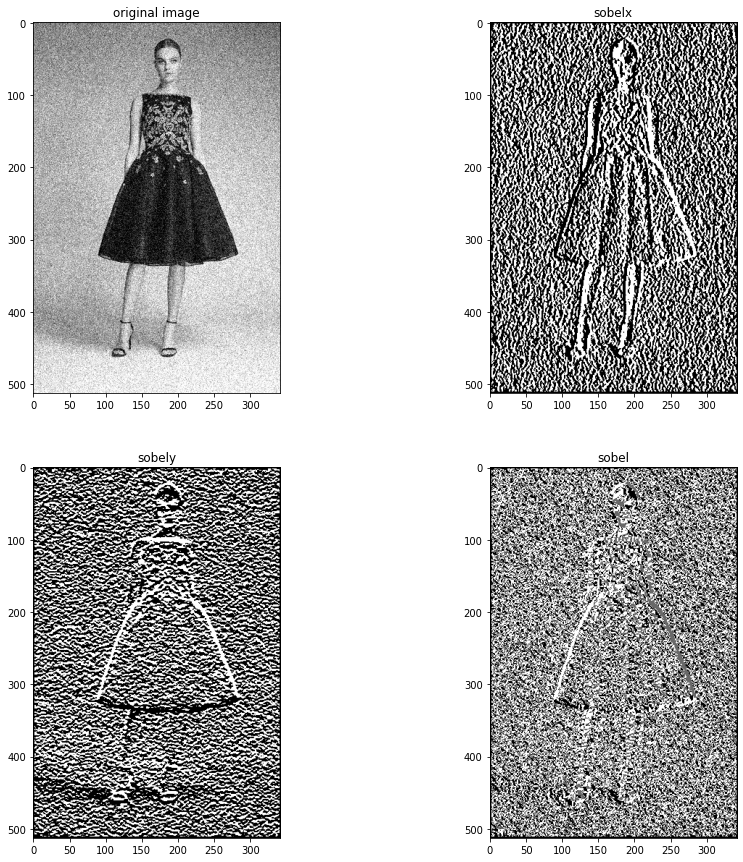

In [30]:
img = cv2.imread('../images/girlNoisy2.jpg',cv2.IMREAD_GRAYSCALE)
sobel5(img)

# Laplacian

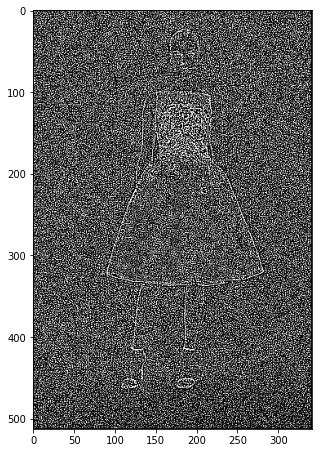

In [31]:
img = cv2.imread('../images/girlNoisy2.jpg',cv2.IMREAD_GRAYSCALE)
kernel = np.array([[1, 1, 1], [1, -8, 1], [1, 1, 1]])
plt.figure(figsize=(5,10))
img_op = convolution(img,kernel)
plt.imshow(img_op,cmap='gray')

# Canny

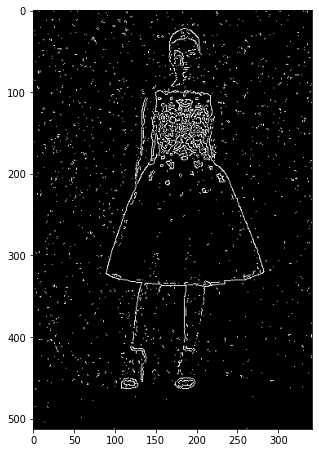

In [32]:
img = cv2.imread('../images/girlNoisy2.jpg',cv2.IMREAD_GRAYSCALE)
output_img = cv2.Canny(img, 350,400)
plt.figure(figsize=(5,10))
plt.imshow(output_img,cmap='gray')

# Observations

The edge detection operators for noisy images: laplacian < prewitt , sobel < canny.
Roberts kernel is small hence less effective in detecting all edges. Laplacian is more affected by noise and for prewitt and sobel lesser the size of filter the less its affected by noise. For canny edge detector for noisy images increasing the minval and maxval will have lesser noise in output.